# COGS 118B - Final Project

# Exploring Influences on the Spread of COVID

# Group Members

- Hunter Flores
- Isabella Real
- Harvey Yang

# Abstract 

Given the COVID-19 data dataset and population statistics of countries around the world, the objective is to cluster based on confirmed cases, confirmed deaths, excess mortality, hospital & ICU, policy responses, reproduction rate, tests & positivity, vaccinations, and country statistics, with the goal of finding the relationship between countries and time. The data used represent 67 variables relating to COVID-19, and 376884 observations, where each of them represent one location and date. We will clean them up so that they can be directly used for our purpose, including renaming and clearing up the redundant columns and indices. Dimensionality reduction will be applied to our model, specifically we will use t-SNE as a way to visualize and better work with our large dataset. Then, we will use GMM to cluster the data in order to determine relationships between countries, and see how variables interact over time. In the end we will try to evaluate the influence of the factors that might decrease the number of cases. As we are choosing GMM as our tools, we will use Bayesian Information Criteria (BIC) to determine the optional number of clusters. We will see that our methods do not provide a good model for the data and recommend that other models be tested in the future to determine more solid results.

# Background

The pandemic has led to significant morbidity and mortality, overwhelmed healthcare systems, disrupted global supply chains, and caused widespread economic and social upheaval, while posing a huge challenge to education which is closely related to us students<a name="daniel"></a>[<sup>[1]</sup>](#daniel).
Thus, there has been a great public interest in studying the pandemic, covering its epidemiology, transmission dynamics, clinical manifestations, socio-economic effects, mental health impacts, and the effectiveness of interventions, including non-pharmaceutical interventions (NPIs) and vaccines<a name="who"></a>[<sup>[2]</sup>](#who).

Prior work involves lots of dimensions of studies. Previous studies have applied clustering algorithms to COVID-19 data to group countries or regions by similar epidemic characteristics or responses.<a name="kucharski"></a>[<sup>[3]</sup>](#kucharski)
Research has also used mathematical modeling to help estimate outbreak dynamics and provide decision guidelines for successful outbreak control.<a name="peirlinck"></a>[<sup>[4]</sup>](#peirlinck)
Therefore, based on all these prior studies done on COVID-19, we are interested in looking at all the aspects of statistics used in evaluation, which can be clustered into different categories. 

# Problem Statement

Given the COVID-19 data dataset and population statistics of countries around the world, the objective is to cluster based on confirmed cases, confirmed deaths, excess mortality, hospital & ICU, policy responses, reproduction rate, tests & positivity, vaccinations, and country statistics, with the goal of finding the relationship between countries and time. What variables affect the number of cases the most? How do the variables change over time?

In [8]:
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from matplotlib.colors import LogNorm
from matplotlib.patches import Ellipse

# two useful data viz libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Make it so more values of the DataFrames and Series are visable
from IPython.display import display

# # Assuming your series is named 'series_data'
# # Set the maximum number of displayed rows and columns to None to display all data
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', None)

%matplotlib inline
%config InlineBackend.figure_format='retina'

# Data

* https://github.com/owid/covid-19-data/tree/master/public/data
* This dataset contains a total of 376884 rows (observations) × 67 columns (variables)
* Each observation consists of information from a given date about the number of cases, deaths, vaccinations, and other data about the population like the number of female and male smokers, diabetes rates, and other statistics.
* Some critical variables are:
  - 'total_cases_per_million' - Total confirmed cases of COVID-19 per 1,000,000 people. Counts can include probable cases, where reported.
  - 'total_deaths_per_million' - Total deaths attributed to COVID-19 per 1,000,000 people. Counts can include probable deaths, where reported.
  - 'reproduction_rate' - Real-time estimate of the effective reproduction rate (R) of COVID-19. See https://github.com/crondonm/TrackingR/tree/main/Estimates-Database
  - 'icu_patients_per_million' - Number of COVID-19 patients in intensive care units (ICUs) on a given day per 1,000,000 people
  - 'hosp_patients_per_million' - Number of COVID-19 patients in hospital on a given day per 1,000,000 people
  - 'total_tests_per_thousand' - Total tests for COVID-19 per 1,000 people
  - 'new_tests_per_thousand' - New tests for COVID-19 per 1,000 people
  - 'positive_rate' - The share of COVID-19 tests that are positive, given as a rolling 7-day average (this is the inverse of tests_per_case)
  - 'tests_per_case' - Tests conducted per new confirmed case of COVID-19, given as a rolling 7-day average (this is the inverse of positive_rate)
  - 'total_vaccinations_per_hundred' - Total number of COVID-19 vaccination doses administered per 100 people in the total population
  - 'people_vaccinated_per_hundred' - Total number of people who received at least one vaccine dose per 100 people in the total population
  - 'people_fully_vaccinated_per_hundred' - Total number of people who received all doses prescribed by the initial vaccination protocol per 100 people in the total population
  - 'total_boosters_per_hundred' - Total number of COVID-19 vaccination booster doses administered per 100 people in the total population
  - 'stringency_index' - Government Response Stringency Index: composite measure based on 9 response indicators including school closures, workplace closures, and travel bans, rescaled to a value from 0 to 100 (100 = strictest response)
  - 'population_density' - Number of people divided by land area, measured in square kilometers, most recent year available
  - 'extreme_poverty' - Share of the population living in extreme poverty, most recent year available since 2010
  - 'cardiovasc_death_rate' -  	Death rate from cardiovascular disease in 2017 (annual number of deaths per 100,000 people)
  - 'handwashing_facilities' - Share of the population with basic handwashing facilities on premises, most recent year available
  - 'hospital_beds_per_thousand' - Hospital beds per 1,000 people, most recent year available since 2010
  - 'life_expectancy' - Life expectancy at birth in 2019
  - 'human_development_index' - A composite index measuring average achievement in three basic dimensions of human development—a long and healthy life, knowledge and a decent standard of living. Values for 2019, imported from http://hdr.undp.org/en/indicators/137506
  - 'population' - Population (latest available values). See https://github.com/owid/covid-19-data/blob/master/scripts/input/un/population_latest.csv for full list of sources
* The above information on the variables and their descriptions is taken from the README in the repo containing the data at https://github.com/owid/covid-19-data/tree/master/public/data
* A lot of the data is sparse, so we will need to handle the data points that are missing. To do this, we will z-score each column and set any NaN values to 0 (the mean). But we will only do this for samples that contain sufficient data (less than 12 Nan values which we found to be the average number of missing datapoints). We will also be making 3 dataframes to observe the changes between the countries on three different days.

In [2]:
df = pd.read_csv("owid-covid-data.csv", low_memory=False)
df

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,total_tests,new_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-06,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-07,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-08,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-09,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,41128772.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376879,ZWE,Africa,Zimbabwe,2024-01-31,266265.0,0.0,4.429,5737.0,0.0,0.0,16314.719,0.0,0.271,351.52,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
376880,ZWE,Africa,Zimbabwe,2024-02-01,266265.0,0.0,4.429,5737.0,0.0,0.0,16314.719,0.0,0.271,351.52,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,16320539.0,NaN,NaN,NaN,NaN
376881,ZWE,Africa,Zimbabwe,2024-02-02,266265.0

## Clean Data Function
This function removes repetitive variable names and gets the data from a specific date. It also removes the World and locations with more than 12 na values (the value of 12 comes from the average number of na values per country, so it takes the countries with more values to gather the best data possible). 

## Normalize Columns with Z-Score
We choose to normalize our values with a Z-Score of each column to get all the variables within the same range of values, avoiding bias in our models toward any given variable that is really large (e.g., population).

In [6]:
def clean_data_for_date(df, date):
    """
    Cleans the DataFrame by finding the data from a specified date, indexing by the location 
    and selecting only certain columns
    
    Args:
    df (pd.DataFrame): Input DataFrame.
    date (string): Formatted like YYYY-MM-DD.
    
    Returns:
    pd.DataFrame: Cleaned up DataFrame.
    """
    df = df[df['date'] == date]
    df = df.set_index('location')[
        [
            'total_cases_per_million', 
            'total_deaths_per_million', 
            'reproduction_rate', 
            'icu_patients_per_million', 
            'hosp_patients_per_million',
            'total_tests_per_thousand',
            'new_tests_per_thousand',
            'positive_rate',
            'tests_per_case',
            'total_vaccinations_per_hundred',
            'people_vaccinated_per_hundred',
            'people_fully_vaccinated_per_hundred',
            'total_boosters_per_hundred',
            'stringency_index',
            'population_density',
            'extreme_poverty',
            'cardiovasc_death_rate',
            'handwashing_facilities',
            'hospital_beds_per_thousand',
            'life_expectancy',
            'human_development_index',
            'population'
        ]
    ]
    df = df.drop('World')
    return df[df.isna().sum(axis=1) <= 12]

# Normalize Columns with Z-Scores
def normalize_columns_zscore(df):
    """
    Normalize each column in the DataFrame by calculating the z-score.
    
    Args:
    df (pd.DataFrame): Input DataFrame.
    
    Returns:
    pd.DataFrame: Normalized DataFrame.
    """
    normalized_df = df.copy()  # Create a copy of the original DataFrame
    
    for column in df.columns:
        mean = df[column].mean()
        std = df[column].std()
        normalized_df[column] = (df[column] - mean) / std  # Calculate z-score for each column
        
    return normalized_df

### Cleaned DataFrame for the date of July 1st, 2020
Also, we filled all the na values with 0, as that is the mean for each column to try to give it no weight to the algorithm and that t-SNE and GMM can't run with na values.

In [7]:
df_loc = normalize_columns_zscore(clean_data_for_date(df, '2020-07-01')).fillna(0)
df_loc

,total_cases_per_million,total_deaths_per_million,reproduction_rate,icu_patients_per_million,hosp_patients_per_million,total_tests_per_thousand,new_tests_per_thousand,positive_rate,tests_per_case,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,stringency_index,population_density,extreme_poverty,cardiovasc_death_rate,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population
location,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,-0.305434,-0.347483,-0.625254,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.871344,-0.235205,0.000000,3.084466,-0.394791,-1.027744,-1.075983,-1.410510,-0.029876
Albania,-0.290543,-0.342040,0.425834,0.000000,0.0,-0.589456,-0.453313,1.009453,-0.116710,0.0,0.0,0.0,0.0,0.343062,-0.157418,-0.620716,0.450735,0.000000,-0.023369,0.746703,0.451162,-0.271512
Algeria,-0.431303,-0.331442,1.272543,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.198797,-0.292369,-0.650285,0.218412,1.043935,-0.439407,0.522515,0.143069,-0.006054
Angola,-0.509079,-0.455140,0.805393,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.727597,-0.282282,0.000000,0.197555,-0.741437,0.000000,-1.564155,-0.951647,-0.064839
Argentina,-0.065238,0.035534,0.396637,0.231284,0.0,-0.563290,-0.370415,1.897900,-0.116895,0.0,0.0,0.0,0.0,1.592153,-0.294175,-0.645357,-0.567046,0.000000,0.863339,0.494657,0.778922,-0.002223
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Venezuela,-0.464439,-0.447660,0.717802,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,1.304141,-0.263219,0.000000,-0.442768,0.000000,-0.901672,-0.116884,-0.099473,-0.110831
Vietnam,-0.510091,0.000000,-2.026703,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,-0.329485,0.155982,-0.576361,-0.077479,1.109811,-0.145238,0.326185,-0.145359,0.330233
Yemen,-0.502047,-0.400690,-0.158104,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.102793,-0.236614,0.251594,2.166850,-0.025812,-0.943696,-0.904857,-1.679272,-0.076782


# Proposed Solution

Our solution includes using t-SNE to reduce dimentionality of our data which are then represented by three timepoints (beginning, middle, and end), and GMM to cluster the data in order to determine possible relationships between countries and/or those between variables. We will use silhoutte scores to visualize and evaluate the effects of different parameters in clustering. We will then judge based on the clustering results to try to determine what variables are most influential in decreasing the number of cases.

## Plotting Functions
The first is taken from A4, and the second uses the library plot to create an interactive plot. Unfortunately, it can't be seen unless run on your machine (it can't be seen on GitHub), but it's mostly useful for our ease of analysis.

In [10]:
# Taken from A4
def plot_components(components,x='pc1',y='pc2'):
    sns.set(rc={'figure.figsize':(24,16)});
    sns.scatterplot(data=components, x=x, y=y)
    sns.despine()
    ax = plt.gca()
    for company in components.index:
        ax.annotate(company,xy=components.loc[company])

def plot_components_plotly(components,x='pc1',y='pc2'):
    fig = px.scatter(components, x=x, y=y, color=components.index, width=1200, height=800)
    fig.show()

## t-SNE Dimensionally Reduction
We use t-SNE to reduce our dimensions and create a 2D plot for our clustering model! We chose a perplexity of 5 to focus on the local comparisons rather than the global ones.

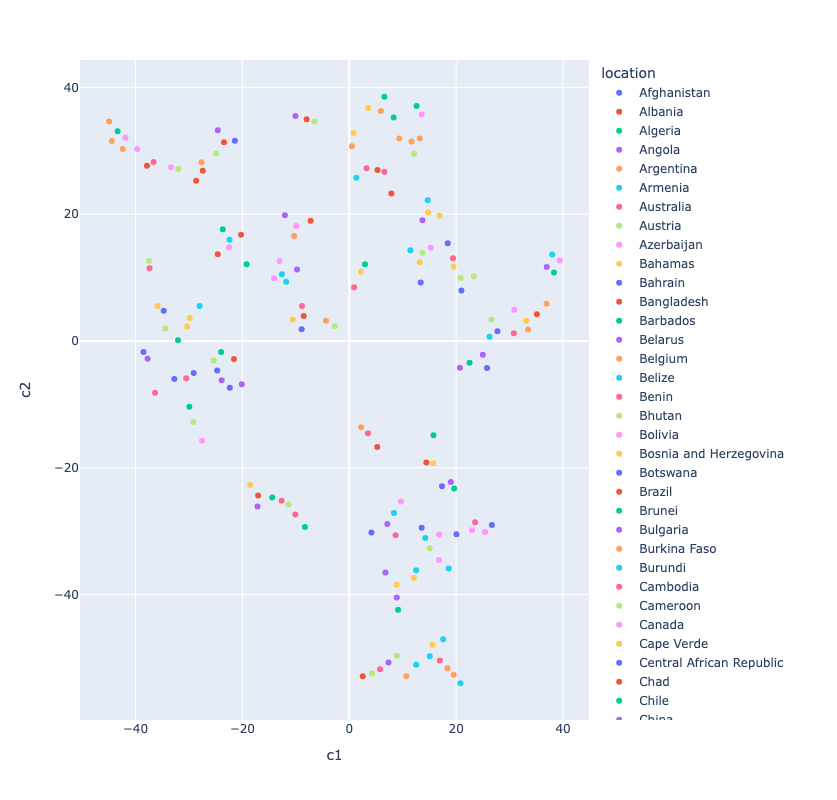

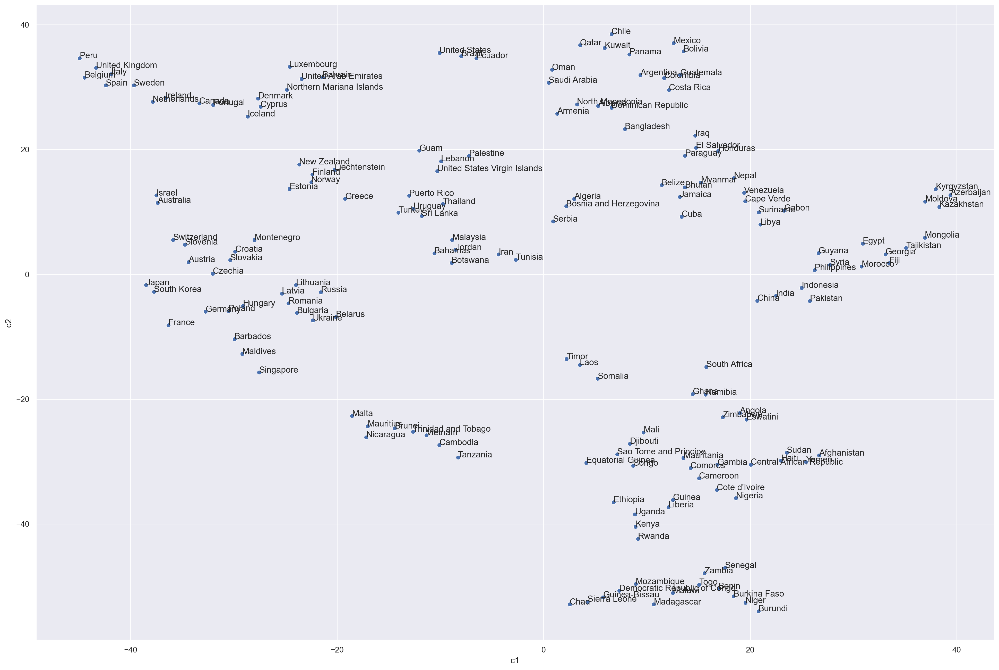

In [11]:
from sklearn.manifold import TSNE

tsne_perp_5 = TSNE(
    n_components=2, 
    learning_rate='auto', 
    init='random', 
    perplexity=5, 
    random_state=99
)

tcs = tsne_perp_5.fit_transform(df_loc)
# construct the data frame
tcs = pd.DataFrame(tcs,columns=['c1','c2'])
tcs.index = df_loc.index

plot_components(tcs,'c1','c2')
plot_components_plotly(tcs,'c1','c2')

## GMM Clustering

In [22]:
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV


# Much of this code is from the lecture notebooks

def plot_gmm(gmm, X, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='rainbow')
    ax.axis('equal')
    w_factor = 0.2 / gmm.weights_.max()
    
    if gmm.covariance_type=='diag':
        fullc = np.array([ np.diag(x) for x in gmm.covariances_])
    elif gmm.covariance_type=='spherical':
        fullc = np.array([ np.diag([x, x]) for x in gmm.covariances_])
    elif gmm.covariance_type=='tied':
        fullc = np.array( gmm.n_components*[gmm.covariances_])
    elif gmm.covariance_type=='full':
        fullc = gmm.covariances_
    else:
        raise NotImplemented
        
    for pos, covar, w in zip(gmm.means_, fullc, gmm.weights_):
        alph = np.max([w*w_factor, 0.05])
        draw_ellipse(pos, covar, ax=ax, alpha=alph)

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle=angle, **kwargs))

# this is your scoring function for Grid Search
def gmm_bic_score(estimator, X):
    """Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(X)

In [24]:
# this is the parameters, of which the Grid Search 
param_grid = {
    "n_components": range(2, 7),
    "covariance_type": ["spherical", "tied", "diag", "full"],
}

estimator = GaussianMixture()

# docs at
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
grid_search = GridSearchCV(
    estimator, param_grid, scoring=gmm_bic_score
)
grid_search.fit(tcs)

GridSearchCV(estimator=GaussianMixture(),
             param_grid={'covariance_type': ['spherical', 'tied', 'diag',
                                             'full'],
                         'n_components': range(2, 7)},
             scoring=<function gmm_bic_score at 0x157593c10>)

# Evaluation Metrics

<!-- <div class="alert alert-warning">
  <strong>Warning!</strong> Please Fix!
</div> -->

### BIC Score
BIC, or Bayesian Information Criteria is the evaluation metric we decided to use for our Gaussian Mixture Model.  We chose BIC because of it's ability to penalize complexity, which we are trying to avoid. We use BIC score to determine the the best number of clusters for our model by conducting a grid search on our model testing out different values for the number of clusters, and then calculating the BIC score for each model and choosing the lowest model with the score.


In [25]:
df_bic = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df_bic["mean_test_score"] = -df_bic["mean_test_score"]
df_bic = df_bic.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
df_bic.sort_values(by="BIC score").head()

,Number of components,Type of covariance,BIC score
0,2,spherical,643.049482
10,2,diag,645.014385
6,3,tied,646.891244
5,2,tied,651.056766
1,3,spherical,651.309379


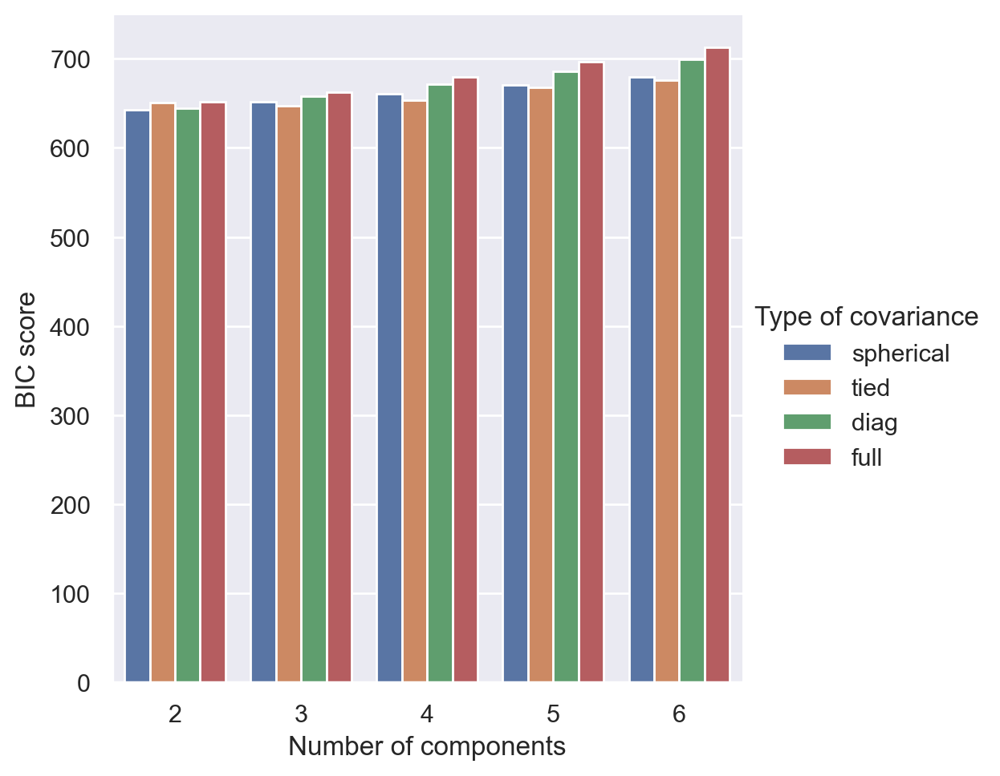

In [14]:
sns.catplot(
    data=df_bic,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
)
plt.show()

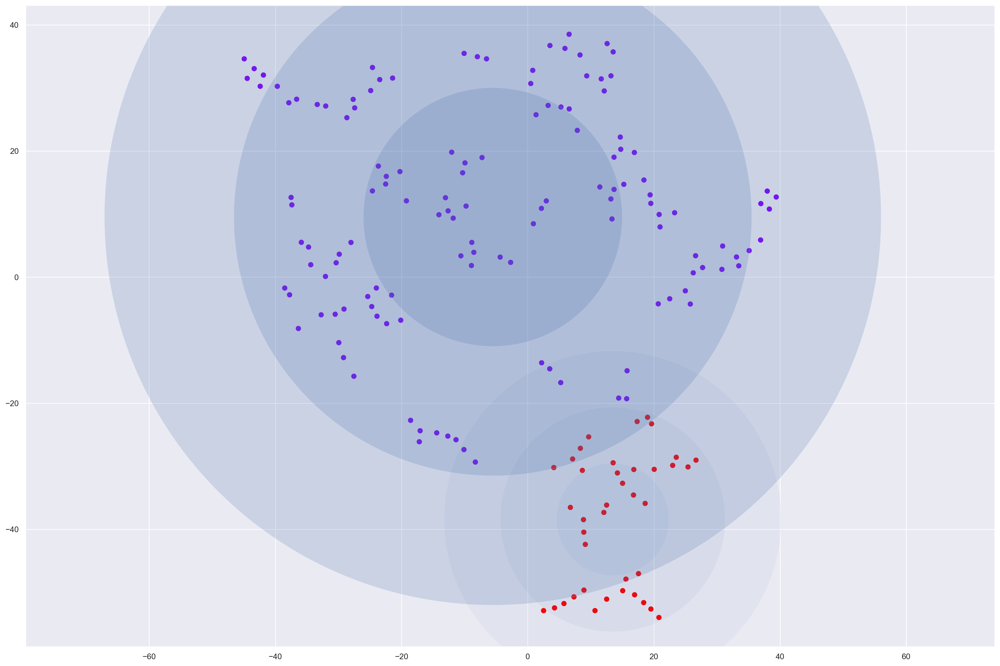

In [16]:
X = np.array(tcs)
plot_gmm(grid_search.best_estimator_, X)

## Put it all together!
Here is a function that does everything that we just walked through, cleaning, t-SNE, plotting, GMM and BIC scoring. To give us the final result for any given day.

In [17]:
def super_fun(super_df, super_date):
    # Cleaning
    df = normalize_columns_zscore(clean_data_for_date(super_df, super_date)).fillna(0)

    # t-SNE
    tsne_perp_5 = TSNE(
        n_components=2, 
        learning_rate='auto', 
        init='random', 
        perplexity=5, 
        random_state=99
    )
    tcs = tsne_perp_5.fit_transform(df)
    # construct the data frame
    tcs = pd.DataFrame(tcs,columns=['c1','c2'])
    tcs.index = df.index
    plot_components_plotly(tcs,'c1','c2')
    plot_components(tcs,'c1','c2')

    # GMM
    param_grid = {
        "n_components": range(2, 7),
        "covariance_type": ["spherical", "tied", "diag", "full"],
    }
    estimator = GaussianMixture()

    grid_search = GridSearchCV(
        estimator, param_grid, scoring=gmm_bic_score
    )
    grid_search.fit(tcs)
    plot_gmm(grid_search.best_estimator_, np.array(tcs))

# Results
Here are the three main dates we will be analyzing.

- July 1st, 2020
- July 1st, 2021
- July 1st, 2022

We chose these dates as they are a year apart to understand the possible changes across time. The choice of July 1st is mostly because many more countries were collecting more robust data, giving us the best data we could get to find some relationships.

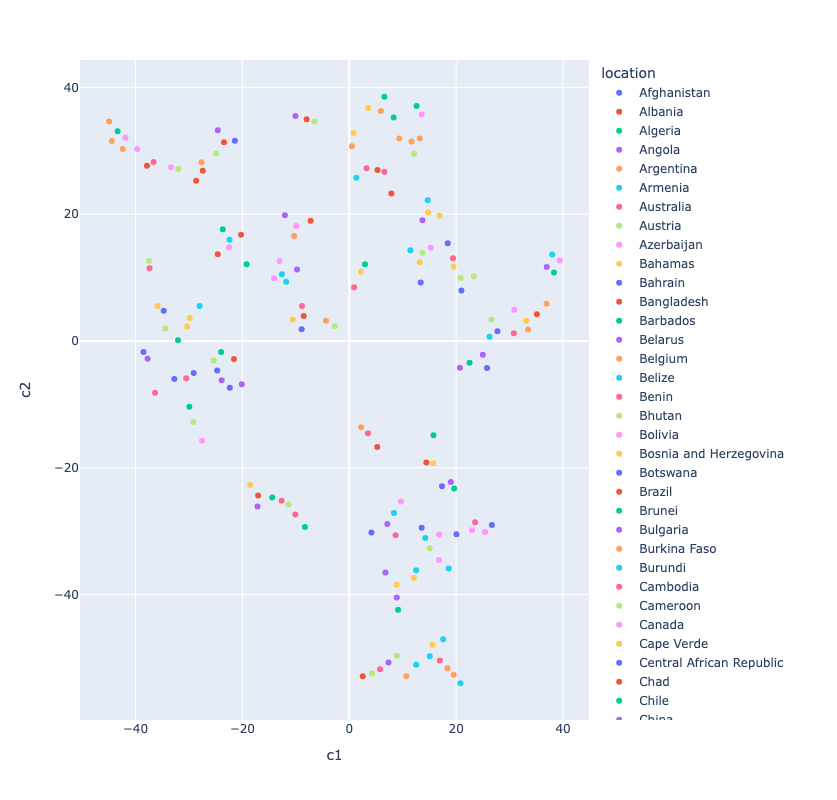

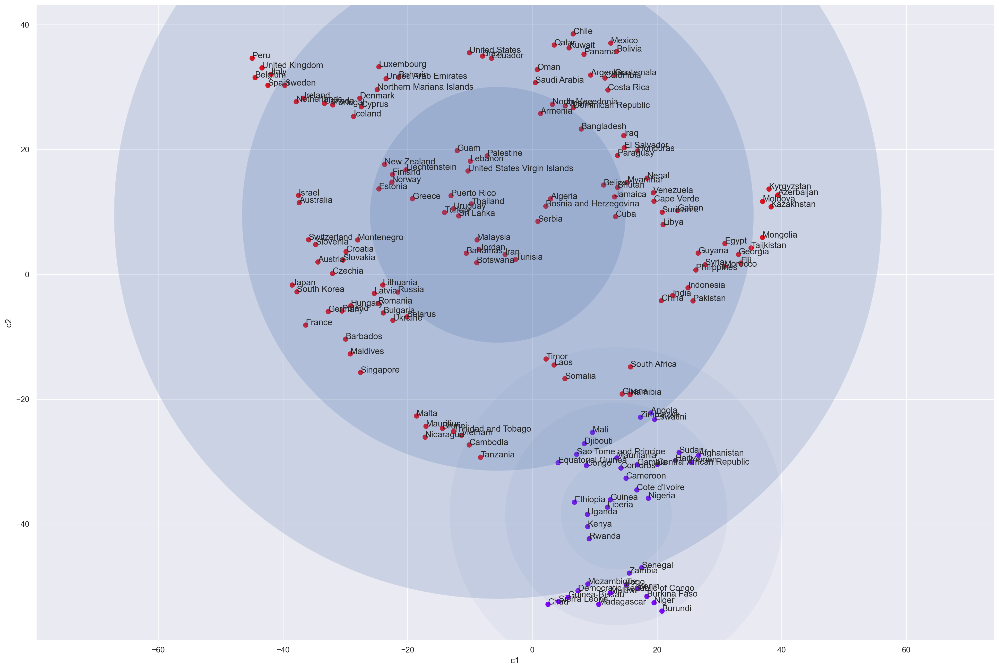

In [18]:
super_fun(df, '2020-07-01')

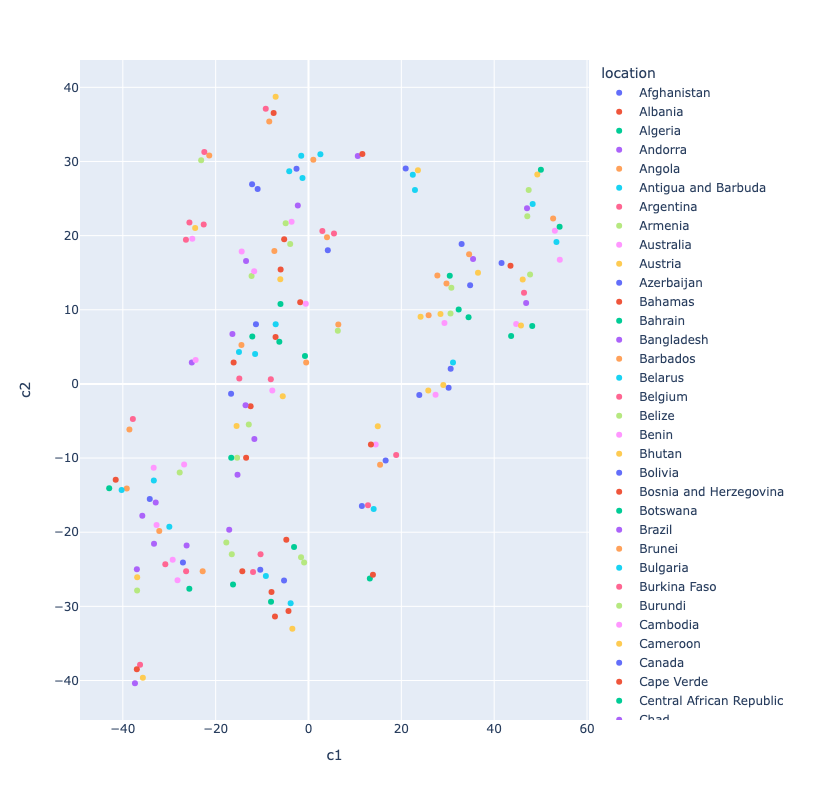

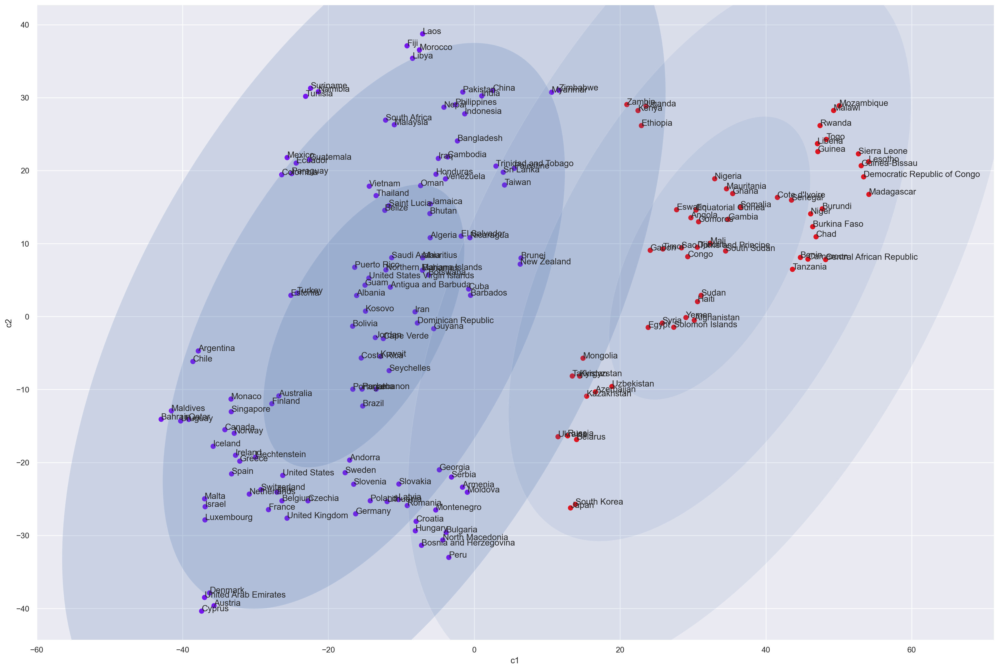

In [19]:
super_fun(df, '2021-07-01')

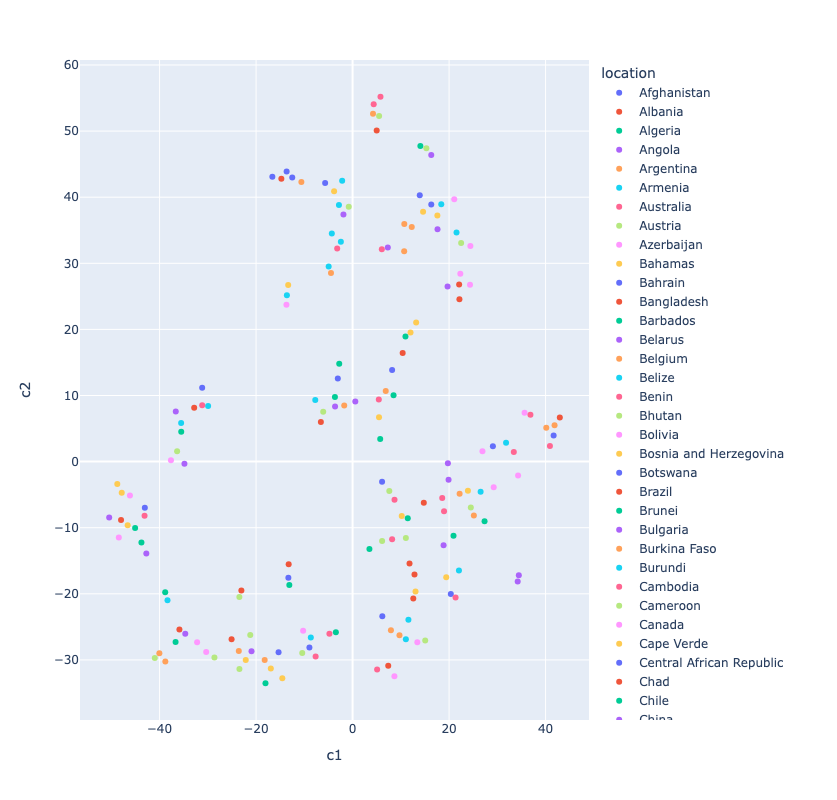

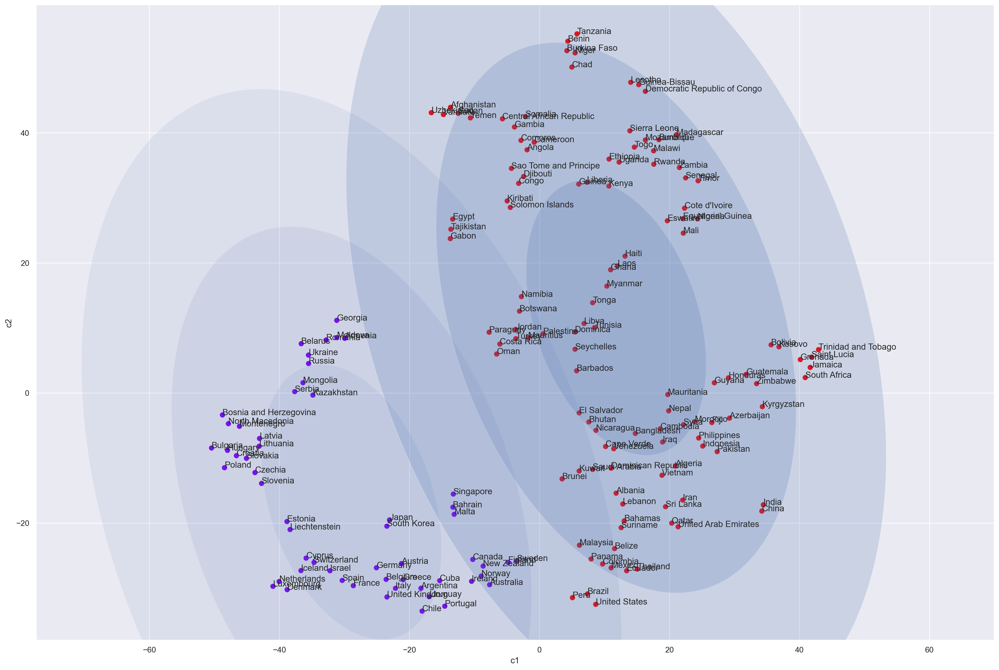

In [20]:
super_fun(df, '2022-07-01')

# Discussion

## Interpreting The Results

<!-- <div class="alert alert-info">
  Please Fill out!
</div> -->
<!-- [OK, you've given us quite a bit of tech informaiton above, now its time to tell us what to pay attention to in all that.  Think clearly about your results, decide on one main point and 2-4 secondary points you want us to understand. Highlight HOW your results support those points.  You probably want 2-5 sentences per point.] -->

### Main Conclusion
The main conclusion our team has come to on these results is that from 2020 to 2022, it is difficult to say with confidence that one particular variable had a very significant effect on COVID cases from our analysis. The best performing model (which was not included in this write-up) was a model with just a single cluster. The reason we did not include that model here is that we thought a single cluster is not very informative when we are trying to glean some more information from the clustering.  So we decided to focus on looking at models with at least 2 clusters.  But we wanted to mention it here in order to give more context for why this ended up being the main conclusion we reached when working with and analyzing the data using the methods above.  It is possible that much of what we are getting from our model is noise, and this may come from our choice of variables, our cleaning of the data, or maybe just the data in itself.

### Other Conclusions Worth Noting
Something that is worth noting is that the data for 2020 and 2021 did seem to cluster a bit more randomly than 2022.  In 2022, there seemed to be a slight correlation between location of countries and the cluster they landed in at least for the smaller cluster. We think this could be a result of the fact that cases may be high in different parts of the world at different times. 

India and China also land close to each other and within the same clustering on each date plotted above. This may also be a result of the fact that similar to the above observation, India and China are geographically close to eachother and maybe their case numbers and death numbers fluctuate more closely together than others as a result of them being nearby and disease spreading easier between the two countries.  This also could be a result of the fact that India and China both have large populations.  In addition to large populations, these countries also have high population densities which would facilitate the spread of the virus.

We can also observe that some European countries, i.e. Denmark, Iceland, Netherlands, Liechtenstein, and Estonia, stayed close to one another in the span of the three years. We think that it is because Northern Europe is relatively isolated from the rest of the world, and the countries have similar sizes, including population density, leading to similar reproduciton rate. In addition, their economies are also relatively close to each other, which implies similar poverty rate, test rate, and life expectancy. 

### Limitations

<!-- <div class="alert alert-info">
  Please Fill out!
</div> -->

Some problems with the work we have above is that we may not have chosen the right variables to look at. For example, maybe considering both 'positive_rate' and 'tests_per_case' wasn't the best choice since these variables are inverses of each other.  Including both of those variables may have been detrimental to our model in the end.  On the other hand, we may also have impacted the result our model by not including more information about smoking or diabetes prevelance. If we had more time, it would have been nice to try using another model to cluster as well as display the data.  We also would have liked to try using AIC rather than BIC to evaluate our clustering and noting if there were differences between the best models in each case.

It is important to note that t-SNE is a good representation of local information but it is not so good at modeling global structure so just because two points are far away when plotted using t-SNE, this does not inherently mean they are actually situated that way in relation to each other. This can lead to confusion when looking at the plots. Had we had more time, it would have been nice to tune our hyperparameters for this a bit more, as well as make more plots at different perplexities and different step sizes (which we didn't have time to do in this project).

### Ethics & Privacy

Data privacy can be one of the most concerning aspects of the internet to the public nowadays. Although our data is mostly on the country level, and all the data is anonymized, it is still crucial to ensure that personal data cannot be de-anonymized to protect personal information of the public. 

One other ethical concern is that we, the Machine Learning engineers, are humans, and are also subject to the common logical biases, which may in turn influence our judgment of the study done in the process of evaluating the data and achieving our goal in this project. 

Another potential impact of this project is the impression it leaves to the public, which can be different to each individual, potentially leading to misuse and misunderstanding of the project in a negative way.

### Conclusion

<!-- <div class="alert alert-info">
  Please Fill out!
</div>
[Reiterate your main point and in just a few sentences tell us how your results support it. Mention how this work would fit in the background/context of other work in this field if you can. Suggest directions for future work if you want to.] -->

In conclusion, our analysis showed that none of the variables can be a determining factor of the increase of COVID cases, nor the death rate, and that it is a complicated event to model. After other previous work in the field, such as mathematical modeling of the transmission of the virus which greatly helped alleviating the situation on the climax of the pendemic, our work shows the complexity of the spread of the virus globally. One future direction can be to model COVID more locally, e.g. within one continent, to figure out what variables play a more important role than others, before generalizing it to a greater scale. 

# Footnotes
<a name="lorenznote"></a>1.[^](#lorenz): Lorenz, T. (9 Dec 2021) Birds Aren’t Real, or Are They? Inside a Gen Z Conspiracy Theory. *The New York Times*. https://www.nytimes.com/2021/12/09/technology/birds-arent-real-gen-z-misinformation.html<br> 
<a name="admonishnote"></a>2.[^](#admonish): Also refs should be important to the background, not some randomly chosen vaguely related stuff. Include a web link if possible in refs as above.<br>
<a name="sotanote"></a>3.[^](#sota): Perhaps the current state of the art solution such as you see on [Papers with code](https://paperswithcode.com/sota). Or maybe not SOTA, but rather a standard textbook/Kaggle solution to this kind of problem
